In [1]:
from train_utils import *
training_config, model_config, cluster_config = get_default_configs(random_string="OPT_1")
dir_name = update_dir_name(model_config, training_config, cluster_config)

In [2]:
import torch
from model_model import TransformerModel
from model_electrode_embedding import ElectrodeEmbedding_Learned, ElectrodeEmbedding_NoisyCoordinate, ElectrodeEmbedding_Learned_CoordinateInit, ElectrodeDataEmbeddingFFT

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Initialize model
model = TransformerModel(
    model_config['transformer']['d_model'],
    model_config['sample_timebin_size'],
    n_layers_electrode=model_config['transformer']['n_layers_electrode'],
    n_layers_time=model_config['transformer']['n_layers_time']
).to(device, dtype=model_config['dtype'])

# Initialize electrode embeddings based on config type
if model_config['electrode_embedding']['type'] == 'learned':
    electrode_embeddings = ElectrodeEmbedding_Learned(
        model_config['transformer']['d_model'],
        embedding_dim=model_config['electrode_embedding']['embedding_dim']
    )
elif model_config['electrode_embedding']['type'] == 'coordinate_init':
    electrode_embeddings = ElectrodeEmbedding_Learned_CoordinateInit(
        model_config['transformer']['d_model'],
        embedding_dim=model_config['electrode_embedding']['embedding_dim']
    )
elif model_config['electrode_embedding']['type'] == 'noisy_coordinate':
    electrode_embeddings = ElectrodeEmbedding_NoisyCoordinate(
        model_config['transformer']['d_model'],
        coordinate_noise_std=model_config['electrode_embedding']['coordinate_noise_std'],
        embedding_dim=model_config['electrode_embedding']['embedding_dim']
    )
else:
    raise ValueError(f"Invalid electrode embedding type: {model_config['electrode_embedding']['type']}")

electrode_embeddings = electrode_embeddings.to(device, dtype=model_config['dtype'])

electrode_data_embeddings = ElectrodeDataEmbeddingFFT(
    electrode_embeddings,
    model_config['sample_timebin_size'],
    max_frequency=model_config['max_frequency'],
    max_n_electrodes=model_config['max_n_electrodes']
).to(device, dtype=model_config['dtype'])

# Load saved model checkpoint
checkpoint = torch.load(f"models_data/{cluster_config['dir_name']}/model_epoch_100.pth")
model.load_state_dict(checkpoint['model_state_dict'])
electrode_data_embeddings.load_state_dict(checkpoint['electrode_data_embeddings_state_dict'])

model.eval()

TypeError: __init__() got multiple values for argument 'n_layers_electrode'

In [3]:
from braintreebank_subject import BrainTreebankSubject

subject_id, trial_id = 1, 2
subject = BrainTreebankSubject(subject_id, allow_corrupted=False, cache=True)
subject_identifier = subject.subject_identifier
subject.load_neural_data(trial_id)

In [4]:
from braintreebank_dataset import BrainTreebankSubjectTrialDataset

dataset = BrainTreebankSubjectTrialDataset(subject, trial_id, window_size=model_config['sample_timebin_size'] * model_config['max_n_timebins'], 
                                           dtype=model_config['dtype'])

In [13]:
dataloader = torch.utils.data.DataLoader(dataset, batch_size=512, shuffle=False)

all_outputs = []
with torch.no_grad():
    for batch in dataloader:
        batch = batch.to(device, dtype=model_config['dtype'])
        electrode_data = electrode_data_embeddings.forward(subject_identifier, batch)
        model_output = model(electrode_data, only_electrode_output=False)[1]
        all_outputs.append(model_output)
    
model_output = torch.cat(all_outputs, dim=0)
model_output.shape

torch.Size([2482, 24, 192])

/tmp/ipykernel_3977805/4131285450.py:53: UserWarning:

This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.



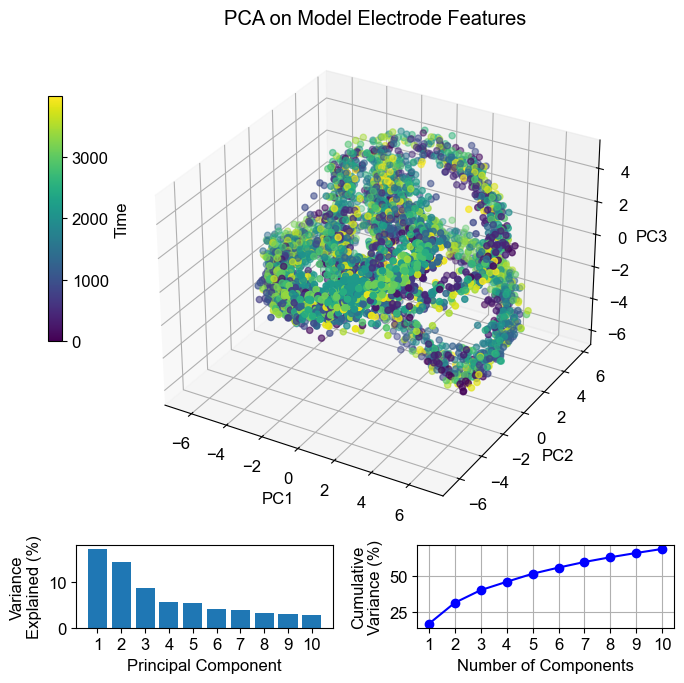

Explained variance ratios: [0.17249992 0.14361146 0.08598636]
torch.Size([4000, 192])


In [14]:
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
import matplotlib.font_manager as fm
font_path = 'analyses/font_arial.ttf'
fm.fontManager.addfont(font_path)
plt.rcParams['font.family'] = 'Arial'
plt.rcParams.update({'font.size': 12})

# Reshape and compute PCA
# original model output shape is (batch_size, n_timebins, d_model)
all_model_output = model_output.reshape(-1, model_output.shape[-1])[1000:5000]
pca = PCA(n_components=10) # Increased components to show more variance explained
pcs = pca.fit_transform(all_model_output.cpu().float().numpy())

# Create figure with subplots
fig = plt.figure(figsize=(7, 7))

# Create a 2x2 grid
gs = plt.GridSpec(2, 2, height_ratios=[6, 1])

# 3D scatter plot - takes up top half
ax1 = fig.add_subplot(gs[0, :], projection='3d')
time_points = np.arange(len(pcs))
model_batch_position = np.arange(model_output.shape[1]).reshape(1, -1).repeat(model_output.shape[0], 1).reshape(-1)
color_by = time_points

scatter = ax1.scatter(pcs[:, 0], pcs[:, 1], pcs[:, 2], c=color_by, cmap='viridis')
cax = fig.add_axes([0.08, 0.5, 0.02, 0.35])  # [left, bottom, width, height]
fig.colorbar(scatter, cax=cax, orientation='vertical', label='Time')

ax1.set_xlabel('PC1')
ax1.set_ylabel('PC2')
ax1.set_zlabel('PC3')
ax1.set_title('PCA on Model Electrode Features')

# Variance explained plot - bottom left
ax2 = fig.add_subplot(gs[1, 0])
variance_explained = pca.explained_variance_ratio_ * 100
ax2.bar(range(1, len(variance_explained) + 1), variance_explained)
ax2.set_xticks(range(1, len(variance_explained) + 1))
ax2.set_xlabel('Principal Component')
ax2.set_ylabel('Variance\nExplained (%)')

# Cumulative variance explained plot - bottom middle
ax3 = fig.add_subplot(gs[1, 1])
cumulative_variance = np.cumsum(variance_explained)
ax3.plot(range(1, len(cumulative_variance) + 1), cumulative_variance, 'bo-')
ax3.set_xticks(range(1, len(cumulative_variance) + 1))
ax3.set_xlabel('Number of Components')
ax3.set_ylabel('Cumulative\nVariance (%)')
ax3.grid(True)

plt.tight_layout()
plt.show()

print(f"Explained variance ratios: {pca.explained_variance_ratio_[:3]}")
print(all_model_output.shape)

In [30]:
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import pandas as pd
from sklearn.decomposition import PCA
import numpy as np

# Reshape and compute PCA
all_model_output = model_output.reshape(-1, model_output.shape[-1])
pca = PCA(n_components=3)
pcs = pca.fit_transform(all_model_output.cpu().float().numpy())[:]

# Create a DataFrame for the PCA results
df = pd.DataFrame({
    'PC1': pcs[:, 0],
    'PC2': pcs[:, 1], 
    'PC3': pcs[:, 2],
    'Time': np.arange(len(pcs))
})

# Create 3D scatter plot
fig = go.Figure(data=[
    go.Scatter3d(
        x=df['PC1'],
        y=df['PC2'],
        z=df['PC3'],
        mode='markers',
        marker=dict(
            size=4,
            color=df['Time'],
            colorscale='Viridis',
            showscale=True
        ),
        name='PCA Components'
    )
])

# Update layout
fig.update_layout(
    height=800,
    showlegend=False,
    scene=dict(
        xaxis_title='PC1',
        yaxis_title='PC2',
        zaxis_title='PC3'
    ),
    title='PCA on Model Electrode Features'
)

fig.show()

print(f"Explained variance ratios: {pca.explained_variance_ratio_[:3]}")
print(all_model_output.shape)

Explained variance ratios: [0.14967446 0.11066365 0.08617546]
torch.Size([59568, 192])


In [ ]:
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import pandas as pd
from sklearn.manifold import TSNE
import numpy as np

# Reshape and compute t-SNE
all_model_output = model_output.reshape(-1, model_output.shape[-1])[:]
tsne = TSNE(n_components=3, random_state=42)
embeddings = tsne.fit_transform(all_model_output.cpu().float().numpy())[:]

Embedding shape: (59568, 3)
torch.Size([59568, 192])


In [28]:
subsampled_embeddings = embeddings[::10]
# Create a DataFrame for the t-SNE results
df = pd.DataFrame({
    'TSNE1': subsampled_embeddings[:, 0],
    'TSNE2': subsampled_embeddings[:, 1], 
    'TSNE3': subsampled_embeddings[:, 2],
    'Time': np.arange(len(subsampled_embeddings))
})

# Create 3D scatter plot
fig = go.Figure(data=[
    go.Scatter3d(
        x=df['TSNE1'],
        y=df['TSNE2'],
        z=df['TSNE3'],
        mode='markers',
        marker=dict(
            size=4,
            color=df['Time'],
            colorscale='Viridis',
            showscale=True
        ),
        name='t-SNE Components'
    )
])

# Update layout
fig.update_layout(
    height=800,
    showlegend=False,
    scene=dict(
        xaxis_title='t-SNE 1',
        yaxis_title='t-SNE 2',
        zaxis_title='t-SNE 3'
    ),
    title='t-SNE on Model Electrode Features'
)

fig.show()

print(f"Embedding shape: {subsampled_embeddings.shape}")
print(all_model_output.shape)

Embedding shape: (5957, 3)
torch.Size([59568, 192])
